<a href="https://colab.research.google.com/github/emille42/DeepLearningNotebooks/blob/master/GimranovEI_Hacks_AI_2022_Success_Rockets_(Yolo_and_semi_supervised_learning).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Description**

# This Notebook was created by Emil Gimranov during HacksAI-2022

# В данном ноутбуке предоставлено мое решение задачи от Success Rockets (подсчет числа зданий на снимках со спутника). 
# Хакатон Цифровой прорыв 2022. Чемпионат: Удмуртская республика
# Краткое описание решения: Предвартельно вручную разметил 315 случайно выбранных фотографий ИЗ ТРЕНИРОВОЧНОЙ ВЫБОРКИ при помощи  Roboflow  
# https://app.roboflow.com/emilleworkspace/buildings_sattelite/2

# В качестве модели была выбрана YoloV5m
# Применялся метод semi-supervised learning. Сначала я обучил модель на размеченных мною 315 фотографиях (+ аугментации). Затем доразметил тренировочную выборку при помощи модели (получил псевдометки). После этого дообучил модель на данных, включающих в себя псевдометки и расставленные мною метки. Далее делал предсказания на тестовой выборке и выполнял подсчет боксов для каждого файла.

# **Imports**

In [1]:
import torch
import torch.nn as nn
import torch.functional as F
import torch.optim as optim
import torchvision
from torchvision import transforms, models
from torch.utils.data import DataLoader, Dataset, RandomSampler
import pandas as pd
import os
import numpy as np
import random
import matplotlib.pyplot as plt
from skimage import io
from tqdm import tqdm
import copy
from IPython.display import clear_output
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [2]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True

# **Dataset**

In [51]:
class ImgDataset(Dataset):
  def __init__(self, img_df, img_path, transform=None, with_label=True):
    self.img_df = img_df
    self.img_path = img_path
    self.transform = transform
    self.with_label = with_label

  def __len__(self):
    return len(self.img_df)
  def __getitem__(self, index):
    path = os.path.join(self.img_path, self.img_df.iloc[index, 0])
    if self.with_label:
      label = int(self.img_df.iloc[index, 1])
    image = io.imread(path)
    if self.transform:
          image = self.transform(image)

    if self.with_label:
      return image, label
    else:
      return image, self.img_df.iloc[index, 0]
  

In [52]:
def show_images(dataloader):
  img_tensors, labels = next(iter(dataloader))
  for idx in range(img_tensors.shape[0]):
      image = img_tensors[idx].permute(1, 2, 0).numpy()
      mean = np.array([0.485, 0.456, 0.406])
      std = np.array([0.229, 0.224, 0.225])
      image = std * image + mean
      plt.imshow(image.clip(0,1))
      plt.title("Класс: " + str(int(labels[idx])))
      plt.show()

In [16]:
TRAIN_PATH = "/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/train/img"

In [17]:
train_df = pd.read_csv("/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/train/train.csv")

In [18]:
train_df.head()

,img_num,number_of_houses
0,000000000611.jpg,9
1,000000000530.jpg,10
2,000000002787.jpg,10
3,000000000049.jpg,2
4,000000001883.jpg,9


In [19]:
number_of_houses = train_df['number_of_houses'].to_numpy().tolist()
max_houses = max(number_of_houses)
np.mean(number_of_houses), max_houses

(8.346190476190475, 34)

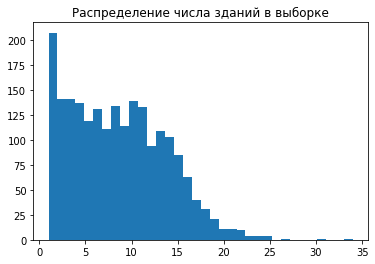

In [20]:
plt.hist(number_of_houses, bins= max_houses)
plt.title('Распределение числа зданий в выборке')
plt.show()


In [21]:
train_df = train_df[train_df.number_of_houses < 26] # удалим ненужные данные из выборки

In [22]:
train_df['number_of_houses'].value_counts()

1     207
2     141
3     141
10    139
4     137
8     134
11    133
6     131
5     119
9     114
7     111
13    109
14    103
12     94
15     85
16     63
17     40
18     31
19     21
21     11
20     11
22     10
25      4
23      4
24      4
Name: number_of_houses, dtype: int64

In [23]:
unlabel_df, to_label_df = train_test_split(train_df, test_size=0.15, random_state=SEED)

In [24]:
import shutil
# копируем картинки, которые будем сами размечать
destination_labeled = '/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/for_labeling'
for name in to_label_df['img_num']:
  path = os.path.join(TRAIN_PATH, name)
  dest = os.path.join(destination_labeled, name)
  shutil.copyfile(path, dest)

# копируем картинки из предоставленного датасета, для которых потом будем создавать псевдо метки (pseudo labels)
destination_unlabeled = '/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled'
for name in unlabel_df['img_num']:
  path = os.path.join(TRAIN_PATH, name)
  dest = os.path.join(destination_unlabeled, name)
  shutil.copyfile(path, dest)

# сохраним в csv  
to_label_df.to_csv('/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/be_labeled.csv', index=False)
unlabel_df.to_csv('/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled.csv', index=False)

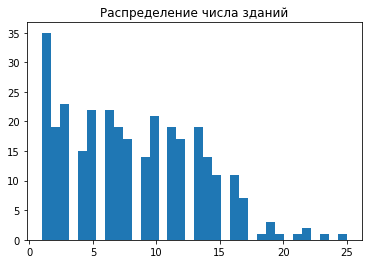

In [25]:
plt.hist(to_label_df['number_of_houses'], bins= max_houses)
plt.title('Распределение числа зданий')
plt.show()

In [ ]:
#TRAIN DATA (создаем даталоадер для просмотра изображений)
train_transforms = transforms.Compose([transforms.ToPILImage(),transforms.Resize(256),
    transforms.ToTensor(), transforms.RandomHorizontalFlip(p=0.7),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
train_dataset = ImgDataset(train_df, TRAIN_PATH, transform=train_transforms)
# sampler = RandomSampler(train_dataset)
train_dataloader = DataLoader(train_dataset, batch_size=30, shuffle=True)

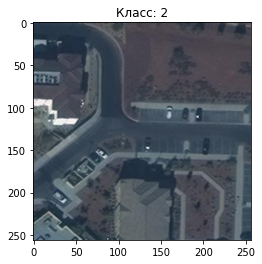

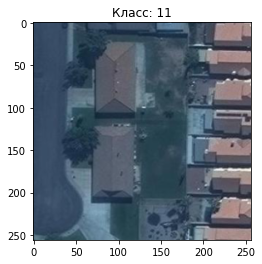

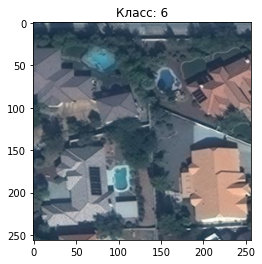

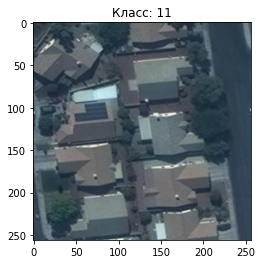

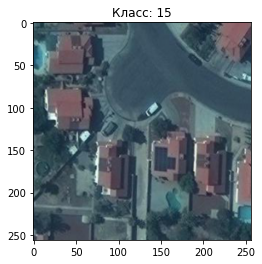

...

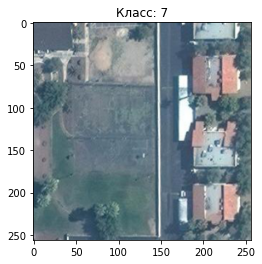

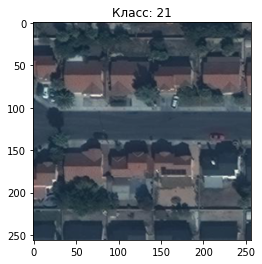

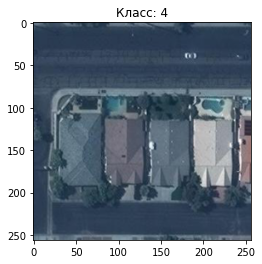

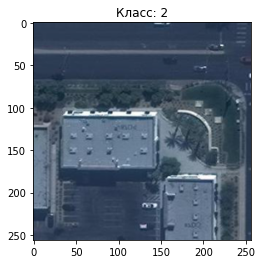

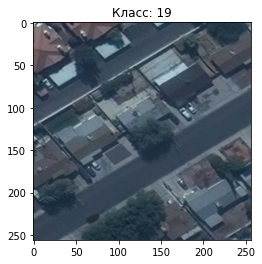

In [ ]:
show_images(train_dataloader)

# **YOLOv5**

In [3]:
!git clone https://github.com/ultralytics/yolov5  # clone

Cloning into 'yolov5'...
remote: Enumerating objects: 12363, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 12363 (delta 16), reused 5 (delta 1), pack-reused 12335
Receiving objects: 100% (12363/12363), 12.18 MiB | 15.57 MiB/s, done.
Resolving deltas: 100% (8530/8530), done.


In [5]:
!cd yolov5 && pip install -r requirements.txt  # install

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
!cd yolov5 && python train.py --batch 32 --epochs 100 --data /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/labeled_aug_imgs/data.yaml --weights yolov5m.pt --cache

train: weights=yolov5m.pt, cfg=, data=/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/labeled_aug_imgs/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-272-g8983324 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0

In [15]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train

<IPython.core.display.Javascript object>

In [6]:
# делаем метки для остальной тестовой выборки
!cd yolov5 && python detect.py --weights /content/best.pt --conf 0.15 --save-txt --source /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled

detect: weights=['/content/best.pt'], source=/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-272-g8983324 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 290 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/1782 /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled/000000000002.jpg: 640x640 16 buildings, Done. (0.029s)
image 2/1782 /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled/000000000003.jpg: 640x640 9 buildings, Done. (0.029s)
image 3/1782 /content/

In [7]:
# наши псевдометки сохранены в txt файлы
!cd /content/yolov5/runs/detect/exp2/labels && cat 000000000248.txt

0 0.661667 0.93 0.676667 0.14
0 0.576667 0.386667 0.76 0.313333


In [8]:
!mkdir -p /content/labeled_and_pseudo/train/images
!mkdir -p /content/labeled_and_pseudo/train/labels
!mkdir -p /content/labeled_and_pseudo/valid/labels
!mkdir -p /content/labeled_and_pseudo/valid/images
# копируем псевдометки и картинки в новую папку
!cp -r /content/yolov5/runs/detect/exp2/labels/* /content/labeled_and_pseudo/train/labels
!cp -r /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/unlabeled/* /content/labeled_and_pseudo/train/images

In [9]:
#копируем ранее использованный датасет в ту же папку (объединяем псевдометки и вручную проставленные метки)
!cp -r /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/labeled_aug_imgs/train/ /content/labeled_and_pseudo/
!cp -r /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/labeled_aug_imgs/valid/ /content/labeled_and_pseudo/
!cp -r /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/trainYolo/labeled_aug_imgs/data.yaml /content/labeled_and_pseudo/

In [ ]:
# Теперь вся тренировочная выборка размечена! Дообучим на ней нашу модель

In [12]:
!cd yolov5 && python train.py --batch 32 --epochs 50 --data /content/labeled_and_pseudo/data.yaml --weights /content/best.pt --cache

train: weights=/content/best.pt, cfg=, data=/content/labeled_and_pseudo/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-272-g8983324 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015,

In [13]:
# Сохраняем лучшую модель на Google Disk
!cp /content/yolov5/runs/train/exp3/weights/best.pt /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/best.pt

In [14]:
# делаем предсказания для тестовой выборки
!cd yolov5 && python detect.py --weights /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/best.pt --conf 0.15 --save-txt --source /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/test

detect: weights=['/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/best.pt'], source=/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-272-g8983324 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 290 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
image 1/900 /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/test/000000000000.jpg: 640x640 Done. (0.029s)
image 2/900 /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/test/000000000007.jpg: 640x640 3 buildings, Done. (0.029s)
image 3/900 /content/drive/MyDriv

In [15]:
# Сохраняем предсказанные координаты рамок
!cp /content/yolov5/runs/detect/exp3/labels/* /content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/test_predicted

In [44]:
# октроем файл с примером решения 
submission_df = pd.read_csv("/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/train/sample_solution.csv")

In [45]:
submission_df.head()

,img_num,number_of_houses
0,000000001801.jpg,1
1,000000001190.jpg,1
2,000000001817.jpg,1
3,000000000251.jpg,1
4,000000002505.jpg,1


In [46]:
# перезапишем данные в CSV файле, предварительно посчитаем предсказания модели
import glob
import re
path = '/content/drive/MyDrive/hacksAI2022/Datasets/SuccessRockets/test_predicted/'
test_img_names = []
test_counts_boxes = []
for txt_file in glob.glob(path + "*"):
    file_name = txt_file[len(path):-3] + "jpg"
    text = open(txt_file)
    n_boxes = len(text.readlines()) # на каждой строке файла - координаты одного здания

    test_img_names.append(file_name)
    test_counts_boxes.append(n_boxes)    

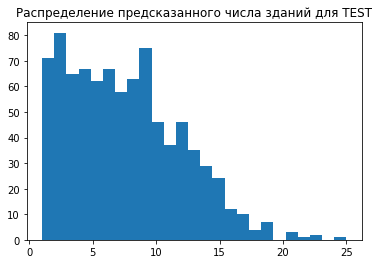

In [47]:
plt.hist(test_counts_boxes, bins=max(test_counts_boxes))
plt.title("Распределение предсказанного числа зданий для TEST")
plt.show()

In [48]:
for name, label in zip(test_img_names, test_counts_boxes):
  submission_df.loc[submission_df['img_num'] == name , 'number_of_houses'] = label

In [49]:
submission_df.head()

,img_num,number_of_houses
0,000000001801.jpg,4
1,000000001190.jpg,3
2,000000001817.jpg,15
3,000000000251.jpg,15
4,000000002505.jpg,4


In [55]:
submission_df.to_csv("submission.csv", index=False)

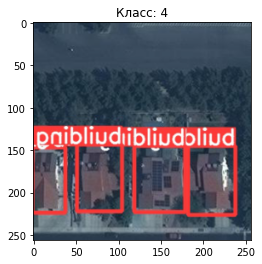

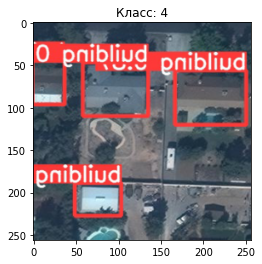

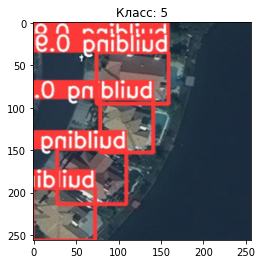

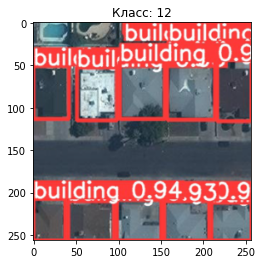

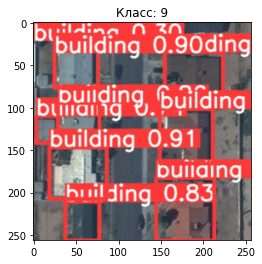

...

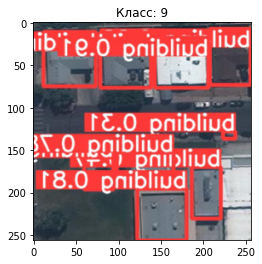

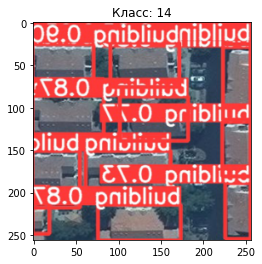

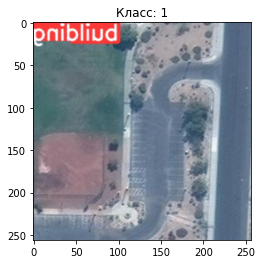

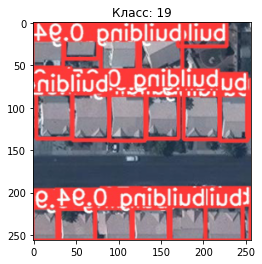

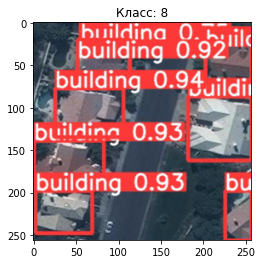

In [54]:
# Посмотрим получившиеся предсказания
trans = transforms.Compose([transforms.ToPILImage(),transforms.Resize(256),
    transforms.ToTensor(), transforms.RandomHorizontalFlip(p=0.7),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
predicted_dataset = ImgDataset(submission_df, '/content/yolov5/runs/detect/exp3', transform=trans)
sampler= RandomSampler(predicted_dataset)
pred_dataloader = DataLoader(predicted_dataset, batch_size=50, sampler=sampler)
show_images(pred_dataloader)